<a href="https://colab.research.google.com/github/ssmubc/Deep-Learning-CNN-model-for-Satellite-LiDAR-Imagery-with-QGIS/blob/main/CNN_QGIS_Image_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Deep Learning CNN Model for Satellite LiDAR Imagery with QGIS - Sharon Marfatia**

Citations:

LiDAR data collected from: https://ftp.maps.canada.ca/pub/elevation/dem_mne/highresolution_hauteresolution/dtm_mnt/1m/AB/Edmonton/utm11/?C=M;O=A

I transformed the map, added RGB channels, changed the standard deviation levels, transparency and various other factors using QGIS. I exported the image as a GEOTIF file. I then imported the new map here, and used it to train the CNN model while integrating image patching/tiling.

Studied:

https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
https://www.tensorflow.org/guide/keras/sequential_model
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

In [1]:
!pip install tensorflow rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 39.8 MB/s eta 0:00:00


In [2]:
from google.colab import files
uploaded = files.upload()

Saving Edmonton_Map_GEO_TIFF_Image.geotif to Edmonton_Map_GEO_TIFF_Image (1).geotif


In [3]:
import numpy as np
import rasterio

def read_preprocess_image(file_path):
    with rasterio.open(file_path) as src:
        # Read the image data
        image = src.read()  # This will have the shape (channels, height, width)

        # Normalize to [0, 1] assuming the image is in uint8
        image = image / 255.0

        # Transpose the image to have channels last: (height, width, channels)
        image = np.transpose(image, (1, 2, 0))

        # Other preprocessing steps can be added here
        # For example, resize if necessary (ensure you have the correct libraries/functions to do this)

    return image

def create_patches(image, patch_size):
    patches = []
    i_max = image.shape[0] - patch_size[0] + 1
    j_max = image.shape[1] - patch_size[1] + 1

    for i in range(0, i_max, patch_size[0]):
        for j in range(0, j_max, patch_size[1]):
            patch = image[i:i + patch_size[0], j:j + patch_size[1]]
            if patch.shape[0] == patch_size[0] and patch.shape[1] == patch_size[1]:
                patches.append(patch)
    return np.array(patches)

# Example of how to call the functions
preprocessed_image = read_preprocess_image('Edmonton_Map_GEO_TIFF_Image.geotif')

# Define the size of patches, e.g., 64x64 pixels
patch_size = (64, 64)

# Create patches from the preprocessed image
image_patches = create_patches(preprocessed_image, patch_size)

# Now you have an array of image patches ready for labeling and training



In [4]:
preprocessed_image

array([[[0.13333333, 0.16470588, 0.15294118, 1.        ],
        [0.14509804, 0.18431373, 0.16862745, 1.        ],
        [0.1372549 , 0.17647059, 0.16078431, 1.        ],
        ...,
        [0.17254902, 0.21960784, 0.2       , 1.        ],
        [0.18823529, 0.23529412, 0.21568627, 1.        ],
        [0.13333333, 0.16470588, 0.15294118, 1.        ]],

       [[0.11764706, 0.14901961, 0.1372549 , 1.        ],
        [0.0745098 , 0.09019608, 0.08235294, 1.        ],
        [0.08627451, 0.10980392, 0.09803922, 1.        ],
        ...,
        [0.15294118, 0.19215686, 0.17647059, 1.        ],
        [0.17254902, 0.21960784, 0.2       , 1.        ],
        [0.14509804, 0.18431373, 0.16862745, 1.        ]],

       [[0.17254902, 0.21960784, 0.2       , 1.        ],
        [0.11372549, 0.14509804, 0.13333333, 1.        ],
        [0.0745098 , 0.09019608, 0.08235294, 1.        ],
        ...,
        [0.15294118, 0.19215686, 0.17647059, 1.        ],
        [0.10588235, 0.137254

In [5]:
print(preprocessed_image.shape)

(664, 1234, 4)


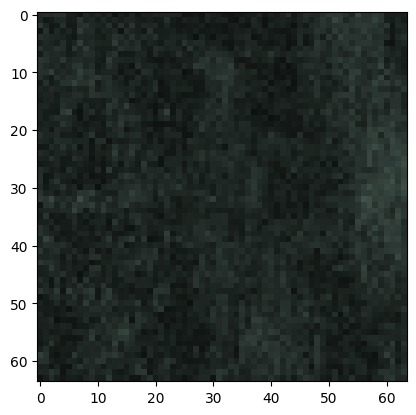

In [6]:
import matplotlib.pyplot as plt

patch = image_patches[0]  # This is the first patch

# Display the patch
plt.imshow(patch)
plt.show()


In [7]:
def create_larger_patches(image, patch_size):
    # Assuming `image` is a numpy array of shape (height, width, channels)
    patches = []
    i_max = image.shape[0] - patch_size[0] + 1
    j_max = image.shape[1] - patch_size[1] + 1

    for i in range(0, i_max, patch_size[0]):
        for j in range(0, j_max, patch_size[1]):
            patch = image[i:i + patch_size[0], j:j + patch_size[1]]
            if patch.shape[0] == patch_size[0] and patch.shape[1] == patch_size[1]:
                patches.append(patch)
    return np.array(patches)

# Define the new, larger size of patches
larger_patch_size = (128, 128)

# Create larger patches from the preprocessed image
larger_image_patches = create_larger_patches(preprocessed_image, larger_patch_size)


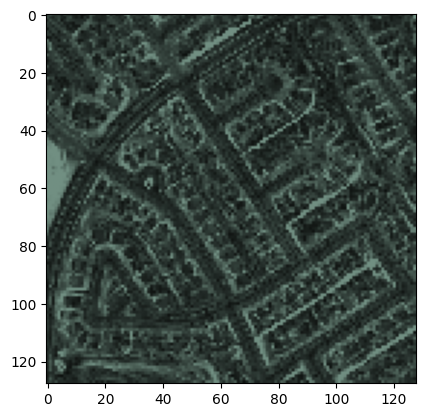

In [8]:
import matplotlib.pyplot as plt

patch = larger_image_patches[16]  # This is the first patch

# Display the patch
plt.imshow(patch)
plt.show()


In [44]:
import matplotlib.pyplot as plt
import csv
import os

# Assuming you have a function to display a patch
def display_patch(patch):
    plt.imshow(patch)  # Display only the first three channels (RGB)
    plt.show()

# Placeholder for the labels, replace with actual labels
labels = []

# A directory where you want to save the patches and labels
save_dir = "/content/CNN_Project_data"
os.makedirs(save_dir, exist_ok=True)


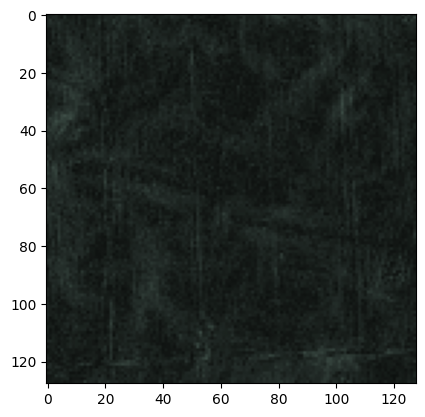

In [10]:
display_patch(larger_image_patches[1])

Patch 0


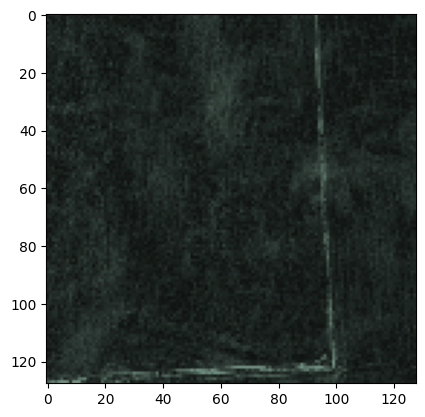

Patch 1


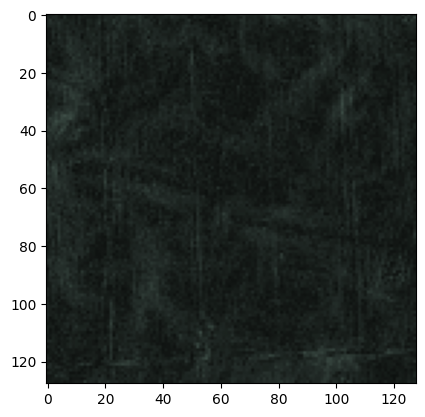

Patch 2


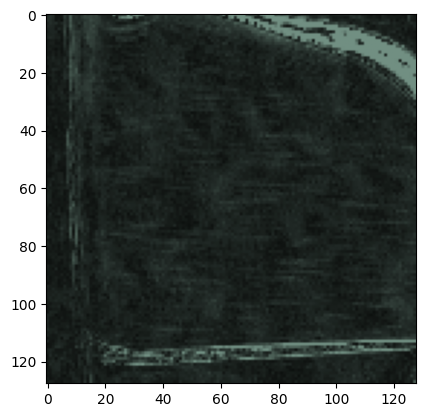

Patch 3


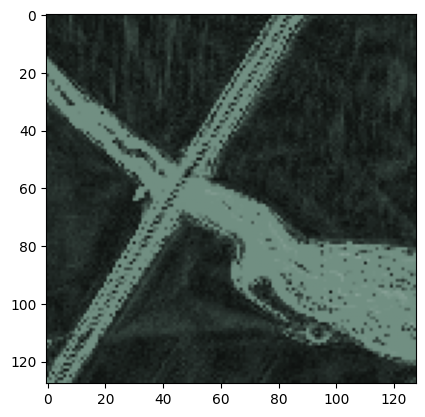

Patch 4


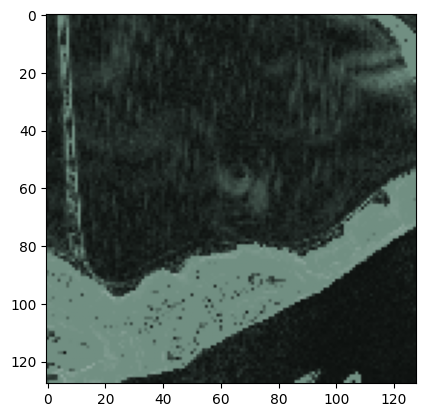

Patch 5


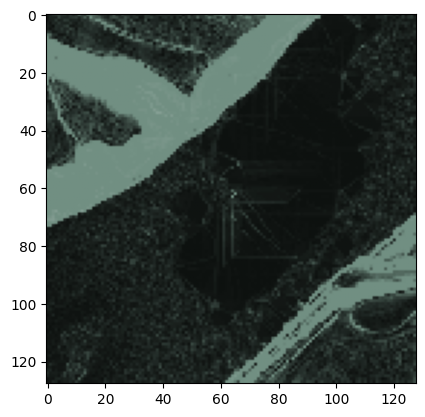

Patch 6


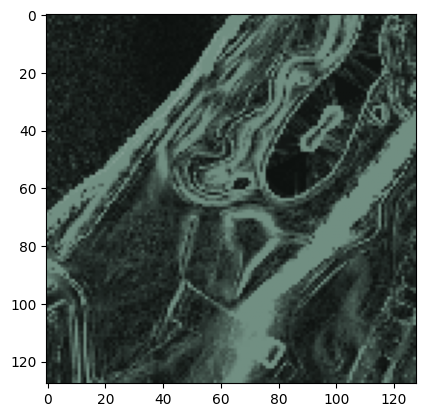

Patch 7


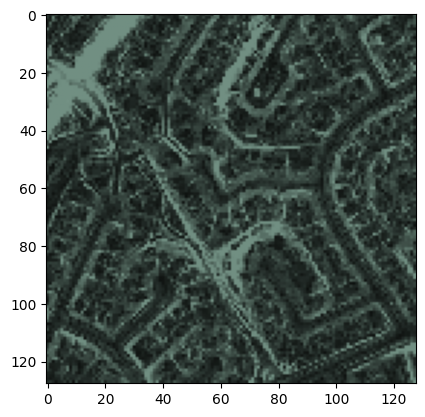

Patch 8


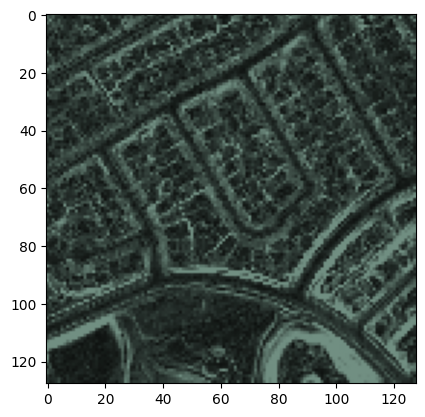

Patch 9


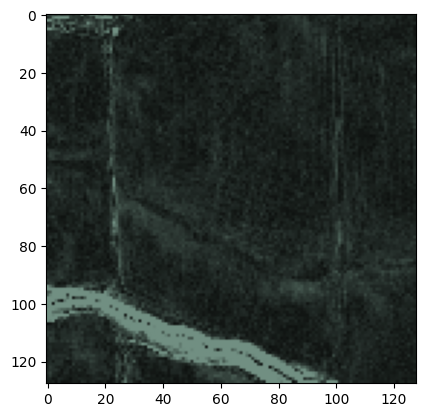

Patch 10


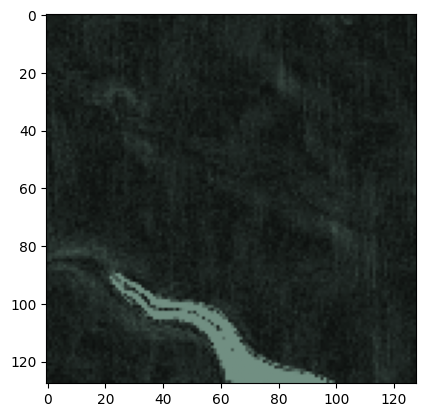

Patch 11


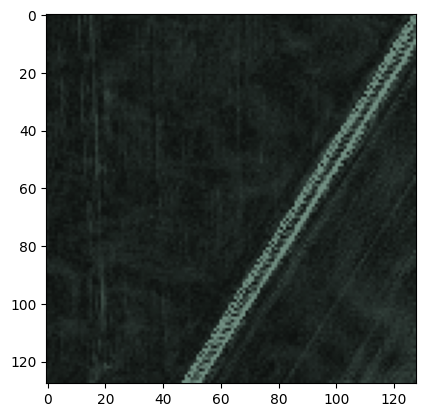

Patch 12


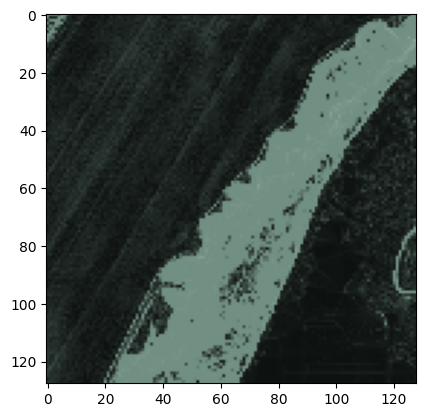

Patch 13


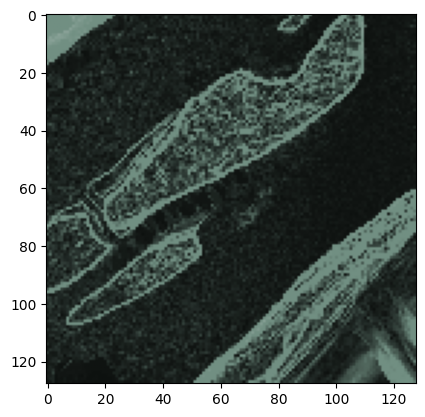

Patch 14


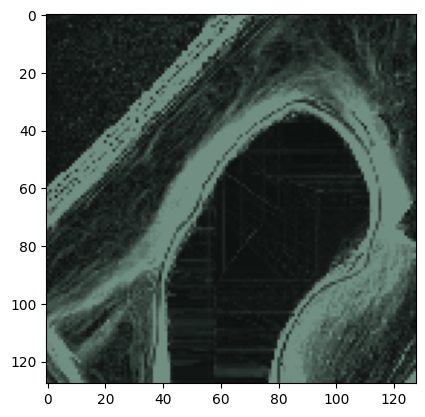

Patch 15


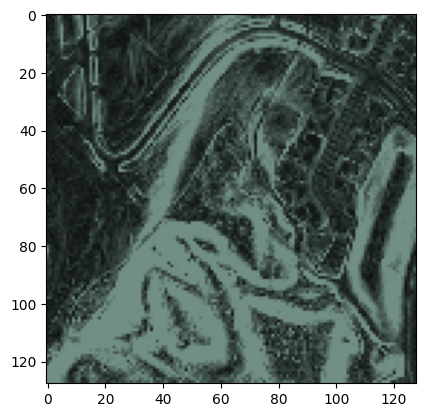

Patch 16


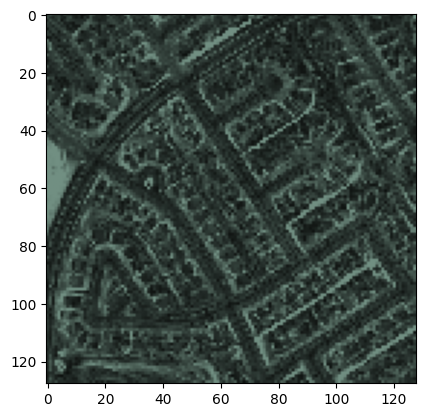

Patch 17


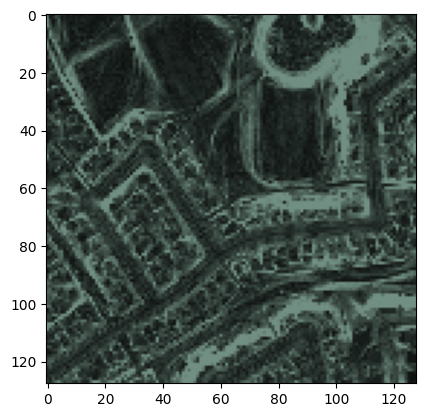

Patch 18


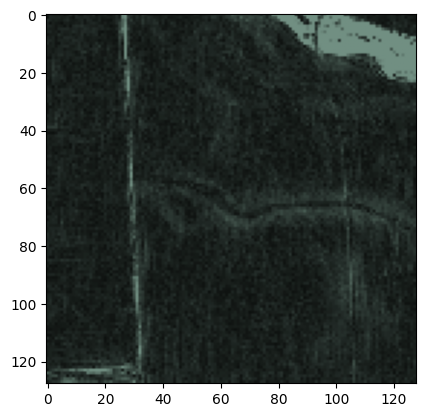

Patch 19


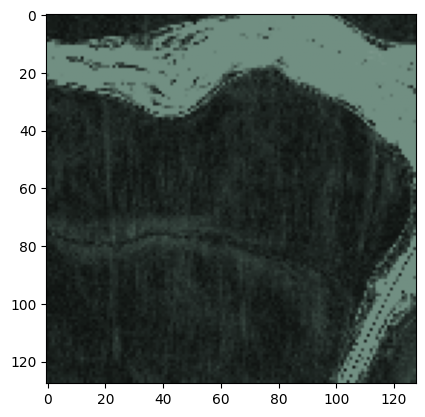

Patch 20


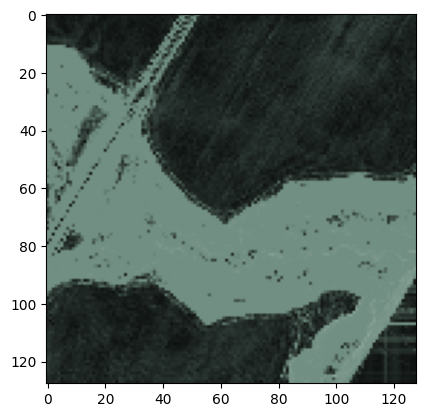

Patch 21


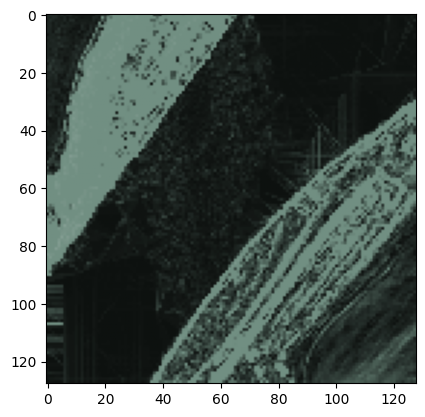

Patch 22


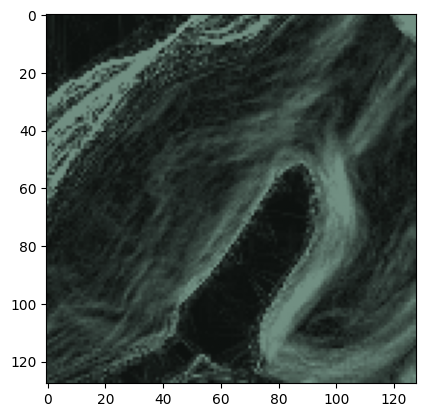

Patch 23


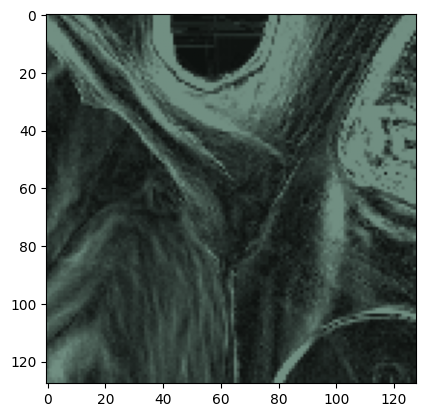

Patch 24


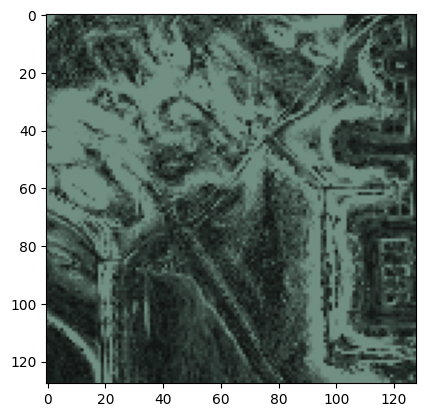

Patch 25


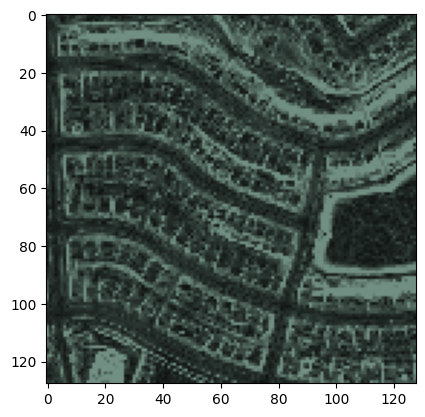

Patch 26


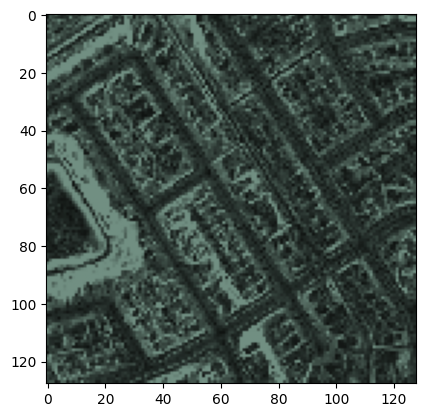

Patch 27


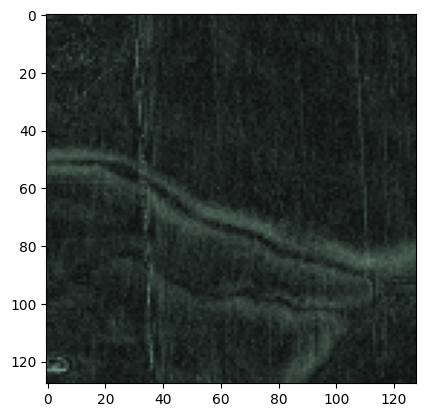

Patch 28


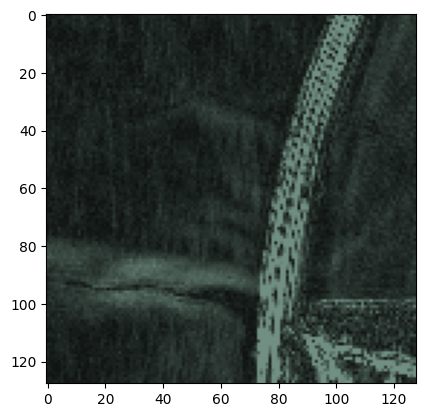

Patch 29


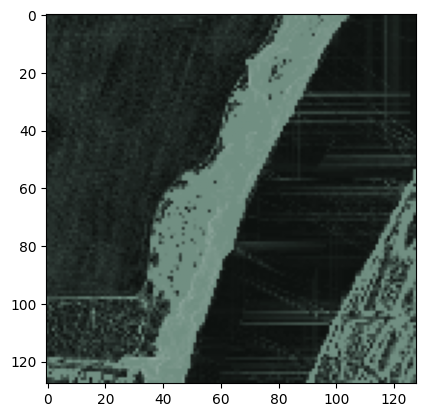

Patch 30


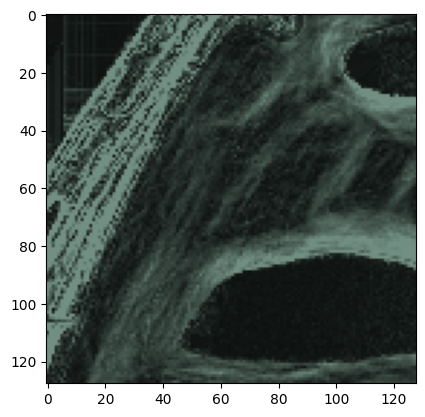

Patch 31


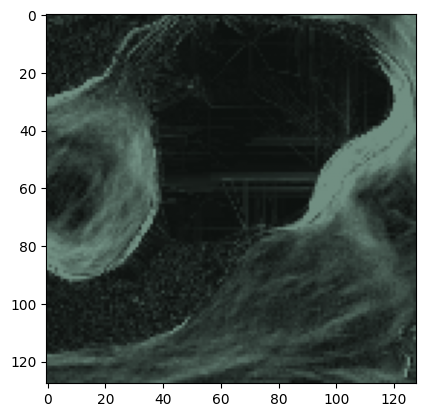

Patch 32


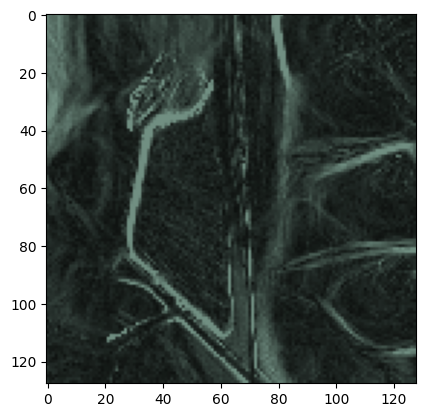

Patch 33


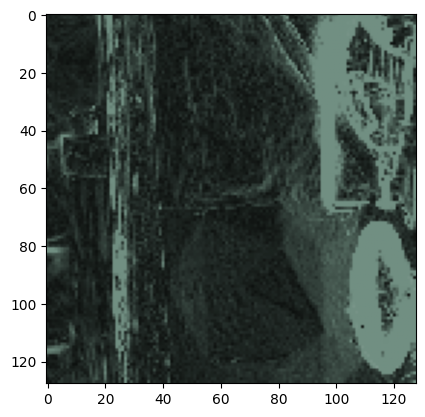

Patch 34


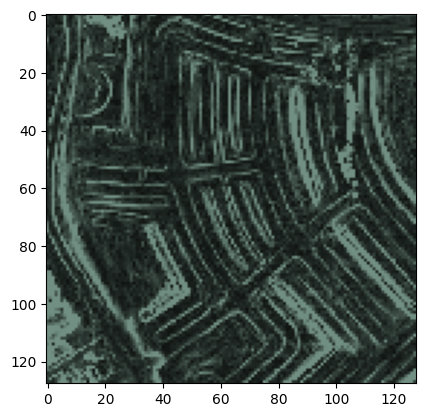

Patch 35


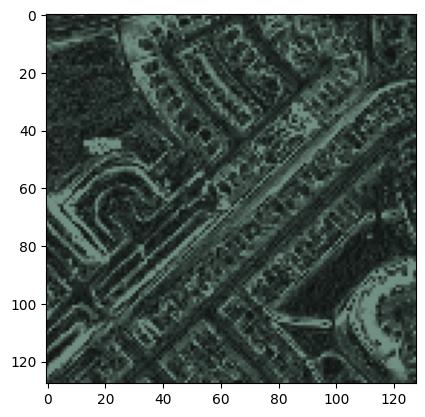

Patch 36


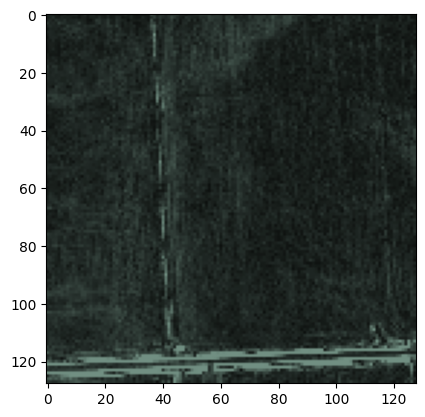

Patch 37


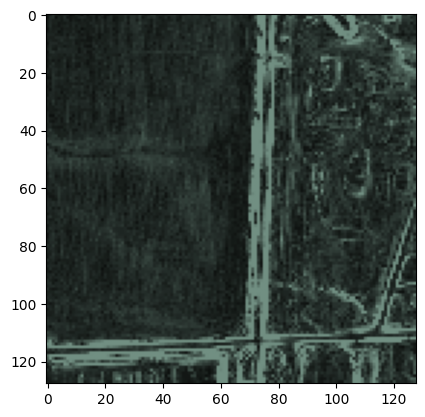

Patch 38


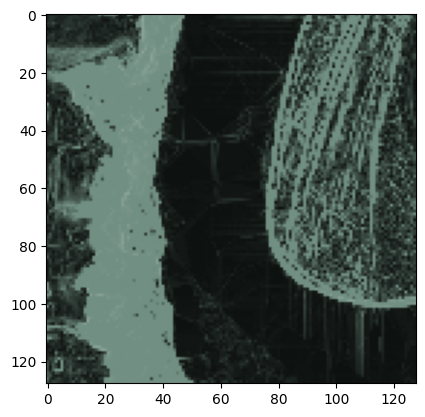

Patch 39


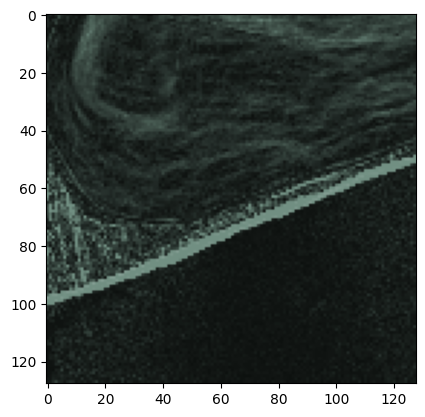

Patch 40


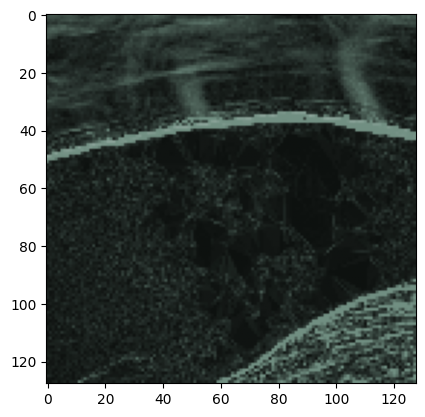

Patch 41


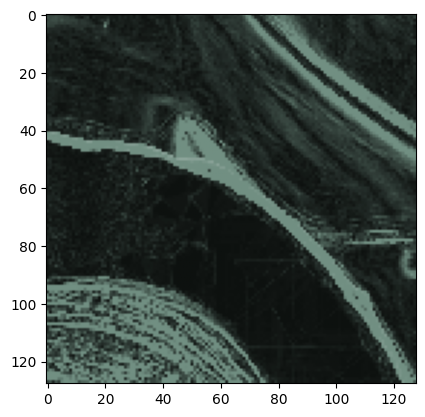

Patch 42


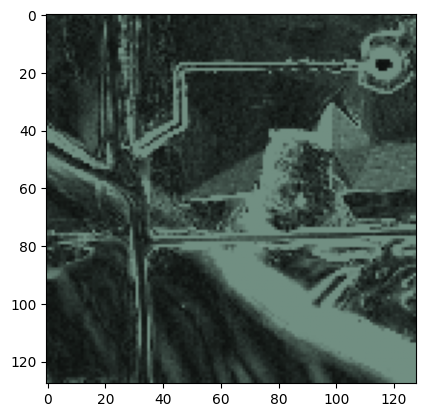

Patch 43


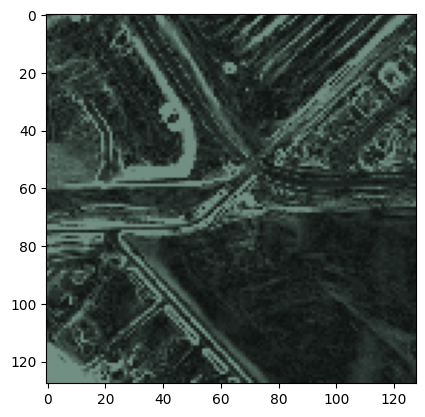

Patch 44


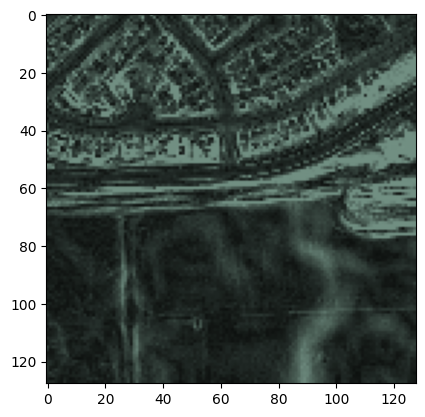

In [11]:
for i, patch in enumerate(larger_image_patches):
    print(f"Patch {i}")
    display_patch(patch)


In [26]:
labels = []  # Reset the labels list if necessary

# Now input all labels based on the indices you wrote down
for i in range(len(larger_image_patches)):
    label = input(f"Enter the label for patch {i}: ")
    labels.append(label)


Enter the label for patch 0: Forest
Enter the label for patch 1: Forest
Enter the label for patch 2: Forest
Enter the label for patch 3: Water
Enter the label for patch 4: Water
Enter the label for patch 5: Forest
Enter the label for patch 6: Mountain
Enter the label for patch 7: City
Enter the label for patch 8: City
Enter the label for patch 9: Forest
Enter the label for patch 10: Forest
Enter the label for patch 11: Forest
Enter the label for patch 12: Water
Enter the label for patch 13: Water
Enter the label for patch 14: Mountain
Enter the label for patch 15: City
Enter the label for patch 16: City
Enter the label for patch 17: City
Enter the label for patch 18: Forest
Enter the label for patch 19: Water
Enter the label for patch 20: Water
Enter the label for patch 21: Water
Enter the label for patch 22: Mountain
Enter the label for patch 23: Mountain
Enter the label for patch 24: Mountain
Enter the label for patch 25: City
Enter the label for patch 26: City
Enter the label for pa

In [27]:
labels

['Forest',
 'Forest',
 'Forest',
 'Water',
 'Water',
 'Forest',
 'Mountain',
 'City',
 'City',
 'Forest',
 'Forest',
 'Forest',
 'Water',
 'Water',
 'Mountain',
 'City',
 'City',
 'City',
 'Forest',
 'Water',
 'Water',
 'Water',
 'Mountain',
 'Mountain',
 'Mountain',
 'City',
 'City',
 'Forest',
 'Forest',
 'Water',
 'Mountain',
 'Water',
 'Mountain',
 'Water',
 'City',
 'City',
 'Forest',
 'Forest',
 'Water',
 'Mountain',
 'Water',
 'Mountain',
 'Mountain',
 'City',
 'City']

In [21]:
# # Save patches and labels to files
# for i, (patch, label) in enumerate(zip(larger_image_patches, labels)):
#     patch_filename = f"patch_{i}_{label}.png"
#     plt.imsave(os.path.join(save_dir, patch_filename), patch[:, :, :3])  # Saving only RGB channels
#     plt.clf()  # Clear the figure after saving each patch

# # Save all labels to a CSV file
# labels_csv_path = os.path.join(save_dir, "labels.csv")
# with open(labels_csv_path, "w", newline="") as f:
#     writer = csv.writer(f)
#     writer.writerow(["Patch Number", "Label"])
#     for i, label in enumerate(labels):
#         writer.writerow([i, label])


In [29]:
labels_df = pd.DataFrame({'Patch Number': range(len(labels)), 'Label': labels})
labels_df.to_csv(labels_csv_path, index=False)

In [20]:
import pandas as pd

# Create a DataFrame from the labels
labels_df = pd.DataFrame({'Patch Number': range(len(labels)), 'Label': labels})

# Save the DataFrame to a CSV file
labels_csv_path = os.path.join(save_dir, "labels.csv")
labels_df.to_csv(labels_csv_path, index=False)

# This will save a CSV file with two columns: 'Patch Number' and 'Label', without the index column


In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# Load labels from the CSV
labels_csv_path = os.path.join(save_dir, "labels.csv")
labels_df = pd.read_csv(labels_csv_path)

# Initialize lists to hold image data and labels
images = []
labels = []

# Loop over the DataFrame rows
for index, row in labels_df.iterrows():
    # Construct the full image filename
    image_filename = os.path.join(save_dir, f"patch_{index}_{row['Label']}.png")

    # Load the image as a numpy array
    image = plt.imread(image_filename)

    # Append the image and label to the lists
    images.append(image)
    labels.append(row['Label'])

# Convert the lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

class_mapping = {'Forest': 0, 'Water': 1, 'City': 2, 'Mountain': 3}
labels = np.array([class_mapping[label] for label in labels])

# Verify shapes
print(images.shape)  # Should show (number_of_patches, patch_height, patch_width, channels)
print(labels.shape)  # Should show (number_of_patches,)


(45, 128, 128, 4)
(45,)


In [33]:
labels

array([0, 0, 0, 1, 1, 0, 3, 2, 2, 0, 0, 0, 1, 1, 3, 2, 2, 2, 0, 1, 1, 1,
       3, 3, 3, 2, 2, 0, 0, 1, 3, 1, 3, 1, 2, 2, 0, 0, 1, 3, 1, 3, 3, 2,
       2])

In [37]:
import tensorflow
import cv2

In [46]:
import os
import shutil

# Base directory where the images are located
base_dir = '/content/CNN_Project_data'

# Create subdirectories for each class and move images
for filename in os.listdir(base_dir):
    if filename.endswith('.png'):  # Check if it's an image
        class_name = filename.split('_')[-1].split('.')[0]  # This should match the class name in the filename
        class_dir = os.path.join(base_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)  # Create class directory if it doesn't exist
        shutil.move(os.path.join(base_dir, filename), os.path.join(class_dir, filename))  # Move file


In [47]:
import tensorflow as tf

# Define some parameters
batch_size = 32  # Or any other size you want
img_height = 128  # The height model expects
img_width = 128   # The width model expects

# Create a dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=save_dir,  # Make sure this is the parent directory where the labeled directories are
    validation_split=0.2,  # Percentage of data to use for validation
    subset="training",  # Specify this subset is for training
    seed=123,  # Seed for shuffling and transformations
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    directory=save_dir,  # Again, the parent directory
    validation_split=0.2,  # The same split percentage
    subset="validation",  # Specify this subset is for validation
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)


Found 45 files belonging to 4 classes.
Using 36 files for training.
Found 45 files belonging to 4 classes.
Using 9 files for validation.


A simple CNN is created with three convolutional layers followed by max pooling layers, a flattening layer, and two dense layers.
The Rescaling layer scales the input values to a range of 0 to 1.
The last dense layer has as many neurons as there are classes, with a softmax activation function for multiclass classification.

In [49]:
# Define the CNN Architecture
import tensorflow as tf
import keras
from keras import layers
from keras import models
model = models.Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),  # Rescaling layer for normalizing pixel values
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(4, activation='softmax')  # Change the number 4 to match the number of classes you have
])

The model is compiled with the Adam optimizer and the sparse categorical cross-entropy loss function, which is appropriate for integer-labeled data.

In [50]:
# Compile the Model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [51]:
# Train the Model
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
2/2 [==============================] - 11s 401ms/step - loss: 1.4190 - accuracy: 0.2222 - val_loss: 1.7162 - val_accuracy: 0.1111
Epoch 2/10
2/2 [==============================] - 0s 35ms/step - loss: 1.3781 - accuracy: 0.2778 - val_loss: 1.4323 - val_accuracy: 0.1111
Epoch 3/10
2/2 [==============================] - 0s 36ms/step - loss: 1.3350 - accuracy: 0.3056 - val_loss: 1.4214 - val_accuracy: 0.1111
Epoch 4/10
2/2 [==============================] - 0s 33ms/step - loss: 1.3116 - accuracy: 0.3056 - val_loss: 1.5025 - val_accuracy: 0.1111
Epoch 5/10
2/2 [==============================] - 0s 34ms/step - loss: 1.2695 - accuracy: 0.2778 - val_loss: 1.7828 - val_accuracy: 0.1111
Epoch 6/10
2/2 [==============================] - 0s 34ms/step - loss: 1.3239 - accuracy: 0.2778 - val_loss: 1.7317 - val_accuracy: 0.1111
Epoch 7/10
2/2 [==============================] - 0s 40ms/step - loss: 1.2429 - accuracy: 0.2778 - val_loss: 1.5274 - val_accuracy: 0.3333
Epoch 8/10
2/2 [=========

In [54]:
# Evaluate the Model
val_loss, val_acc = model.evaluate(val_ds)
print(f"Validation accuracy: {val_acc}")

1/1 [==============================] - 0s 60ms/step - loss: 1.4970 - accuracy: 0.3333
Validation accuracy: 0.3333333432674408


Lets try to improve the validation accuracy

In [55]:
import tensorflow as tf
import keras
from keras import layers
from keras import models
from keras import regularizers
# Define the model architecture with added complexity and regularization
model = models.Sequential([
    # Input layer with batch normalization
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Additional convolutional layers with increasing filter count and dropout
    layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),  # Dropout for regularization

    layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.4),

    layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.5),

    # Flattening layer followed by dense layers with L2 regularization
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.5),  # Additional dropout in dense layer
    layers.Dense(4, activation='softmax')  # Adjust the number of neurons to match the number of classes
])


In [56]:
# Hyperparameter tuning with learning rate
learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print the model summary to check the architecture
model.summary()

# Train the model for more epochs
epochs = 25  # Increase the number of epochs
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 128, 128, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 batch_normalization_1 (Bat  (None, 64, 64, 64)       

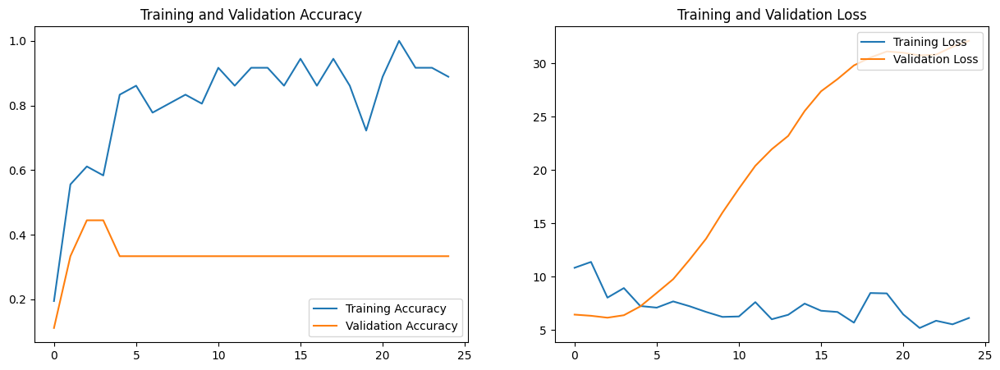

In [59]:
# Plot the training history
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(epochs)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

The training and validation accuracy plot indicates that the model's training accuracy is high and generally improving, while the validation accuracy is significantly lower and not improving in tandem. This is a sign of overfitting, where the model is learning to perform very well on the training data but is not generalizing effectively to unseen data.

The training and validation loss plot supports this diagnosis as the training loss decreases significantly, indicating the model is learning the training data well, but the validation loss is erratic and generally not improving.

To address overfitting:

Data Augmentation: Enhance the dataset with more variations. Since you are using image_dataset_from_directory, you can define an ImageDataGenerator for the training dataset with more augmentation parameters.

In [64]:
import tensorflow as tf
import keras
from keras import callbacks

# Add early stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,  # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True
)

# Implement more aggressive data augmentation
data_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [66]:
import tensorflow as tf
import keras
from keras import layers

# Define the data augmentation layers
data_augmentation_layers = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2),
    layers.experimental.preprocessing.RandomZoom(0.2),
    layers.experimental.preprocessing.RandomTranslation(0.2, 0.2),
    layers.experimental.preprocessing.Rescaling(1./255)  # Normalizing the images
])

# Apply data augmentation to the training dataset
augmented_train_ds = train_ds.map(lambda x, y: (data_augmentation_layers(x, training=True), y))


In [88]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory="/content/CNN_Project_data",  # The path to the parent directory of data.
    labels='inferred',  # 'inferred' will label datasets from the directory structure.
    label_mode='int',  # 'int' means that the labels are encoded as integers (e.g., 0, 1, 2, ... for classification).
    batch_size=32,  # Size of the batches of data (default is 32).
    image_size=(128, 128),  # The size to resize images to after they are read from disk.
    shuffle=True,  # Whether to shuffle the data. Default is True.
    seed=123,  # Optional random seed for shuffling and transformations.
    validation_split=0.3,  # Float. The fraction of the data to reserve for validation.
    subset="training",  # One of "training" or "validation". Only used if `validation_split` is set.
    color_mode='rgb',  # 'rgb' if the images are in color, 'grayscale' if in black and white.
    interpolation='bilinear',  # The interpolation method used to resize images. Default is 'bilinear'.
    follow_links=False  # Whether to follow symlinks inside class subdirectories (default is False).
)

Found 45 files belonging to 4 classes.
Using 32 files for training.


In [89]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    directory="/content/CNN_Project_data",  # Same as above.
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=123,
    validation_split=0.3,
    subset="validation",  # Use "validation" subset for the validation dataset.
    color_mode='rgb',
    interpolation='bilinear',
    follow_links=False
)

Found 45 files belonging to 4 classes.
Using 13 files for validation.


In [90]:
# Now apply the augmentation defined earlier to the train_ds
augmented_train_ds = train_ds.map(lambda x, y: (data_augmentation_layers(x, training=True), y))

In [92]:
# Use augmented_train_ds in model.fit call instead of train_ds
history = model.fit(
    augmented_train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stopping]
)

Epoch 1/25
1/1 [==============================] - 2s 2s/step - loss: 5.5777 - accuracy: 0.6250 - val_loss: 17.1810 - val_accuracy: 0.2308
Epoch 2/25
1/1 [==============================] - 1s 555ms/step - loss: 5.1776 - accuracy: 0.6250 - val_loss: 16.4916 - val_accuracy: 0.2308
Epoch 3/25
1/1 [==============================] - 0s 452ms/step - loss: 5.4343 - accuracy: 0.6562 - val_loss: 15.7599 - val_accuracy: 0.2308
Epoch 4/25
1/1 [==============================] - 0s 473ms/step - loss: 5.1112 - accuracy: 0.6875 - val_loss: 15.1336 - val_accuracy: 0.2308
Epoch 5/25
1/1 [==============================] - 1s 665ms/step - loss: 5.0259 - accuracy: 0.7812 - val_loss: 14.4221 - val_accuracy: 0.2308
Epoch 6/25
1/1 [==============================] - 0s 417ms/step - loss: 5.2765 - accuracy: 0.5312 - val_loss: 13.8204 - val_accuracy: 0.2308
Epoch 7/25
1/1 [==============================] - 0s 454ms/step - loss: 5.2437 - accuracy: 0.5938 - val_loss: 13.4492 - val_accuracy: 0.2308
Epoch 8/25
1/1 [

In [93]:
# Evaluate the Model
val_loss, val_acc = model.evaluate(val_ds)
print(f"Validation accuracy: {val_acc}")

1/1 [==============================] - 0s 38ms/step - loss: 9.2712 - accuracy: 0.4615
Validation accuracy: 0.4615384638309479
